In [1]:
# Install YOLO libraries (ultralytics for YOLOv5/8)
!pip install ultralytics

In [2]:
import pandas as pd
import torch
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO

In [3]:
imgs = []
for i in range(1, 51):
    img = Image.open(f'Dataset/UsedImages/Image_{i}.jpg')
    imgs.append(img)

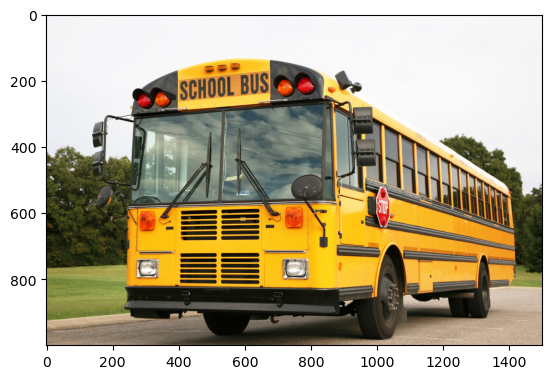

In [4]:
# print first image
plt.imshow(imgs[0])

In [5]:
labels = pd.read_csv('Dataset/labels.csv')
labels.head()

,filename,file_size,file_attributes,region_count,region_id,region_shape_attributes,region_attributes
0,Image_1.jpg,346587,{},1,0,"{""name"":""rect"",""x"":128,""y"":139,""width"":1301,""h...","{""Bus"":""""}"
1,Image_2.jpg,571056,{},1,0,"{""name"":""rect"",""x"":358,""y"":64,""width"":1274,""he...","{""Bus"":""""}"
2,Image_3.JPG,566699,{},1,0,"{""name"":""rect"",""x"":260,""y"":206,""width"":1275,""h...","{""Bus"":""""}"
3,Image_4.jpg,893171,{},1,0,"{""name"":""rect"",""x"":4,""y"":590,""width"":3084,""hei...","{""Bus"":""""}"
4,Image_5.jpg,671785,{},1,0,"{""name"":""rect"",""x"":155,""y"":20,""width"":697,""hei...","{""Bus"":""""}"


In [6]:
model = YOLO('yolov5s.pt')

PRO TIP  Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [7]:
# run the model on the images
results = model(imgs, imgsz=640)


0: 640x640 1 bus, 1 traffic light, 197.9ms
1: 640x640 8 persons, 1 bus, 2 clocks, 197.9ms
2: 640x640 1 bus, 197.9ms
3: 640x640 2 persons, 1 car, 1 bus, 197.9ms
4: 640x640 12 persons, 1 bus, 197.9ms
5: 640x640 1 bus, 197.9ms
6: 640x640 3 persons, 2 buss, 197.9ms
7: 640x640 4 persons, 1 bus, 197.9ms
8: 640x640 2 buss, 197.9ms
9: 640x640 3 buss, 197.9ms
10: 640x640 1 bus, 197.9ms
11: 640x640 11 persons, 2 cars, 1 bus, 197.9ms
12: 640x640 6 persons, 1 bus, 197.9ms
13: 640x640 4 persons, 2 buss, 1 fire hydrant, 3 handbags, 197.9ms
14: 640x640 7 persons, 1 bus, 197.9ms
15: 640x640 3 persons, 1 bus, 197.9ms
16: 640x640 1 bus, 2 chairs, 197.9ms
17: 640x640 1 bus, 197.9ms
18: 640x640 3 cars, 1 bus, 197.9ms
19: 640x640 4 persons, 1 bus, 197.9ms
20: 640x640 2 persons, 1 car, 4 buss, 1 truck, 197.9ms
21: 640x640 4 persons, 1 car, 1 bus, 1 handbag, 197.9ms
22: 640x640 1 car, 1 bus, 197.9ms
23: 640x640 1 person, 1 bus, 197.9ms
24: 640x640 1 bus, 197.9ms
25: 640x640 1 car, 197.9ms
26: 640x640 1 car,

In [8]:
# 'results' contains predictions for all images in the batch
predicted_classes_per_image = []

# Loop through each result in results (each result corresponds to one image)
for result in results:
    # For each image, get the predicted classes
    predicted_classes = [result.names[int(cls_idx)] for cls_idx in result.boxes.cls]
    # Append the predicted classes for this image to the list
    predicted_classes_per_image.append(predicted_classes)

# Now 'predicted_classes_per_image' is a list where each element corresponds to one image's predictions

# Extract the actual classes from the labels.csv file. classes are in the following format: "{""Bus"":""""}
actual_classes = [labels['region_attributes'][i].split('"')[1] for i in range(50)]

print(len(predicted_classes_per_image), len(actual_classes))

50 50


In [9]:
print(predicted_classes_per_image[0])

['bus', 'traffic light']


In [10]:
# check for each image if the actual class is in the predicted classes
correct = 0
for i in range(50):
    if str.lower(actual_classes[i]) in predicted_classes_per_image[i]:
        correct += 1
    else :
        print(f'Actual: {actual_classes[i]}')
        print(f'Predicted: {predicted_classes_per_image[i]}')
        print()

accuracy = correct / 50
print(f'Accuracy: {accuracy}')
print(f'Correct: {correct}')


Accuracy: 1.0
Correct: 50


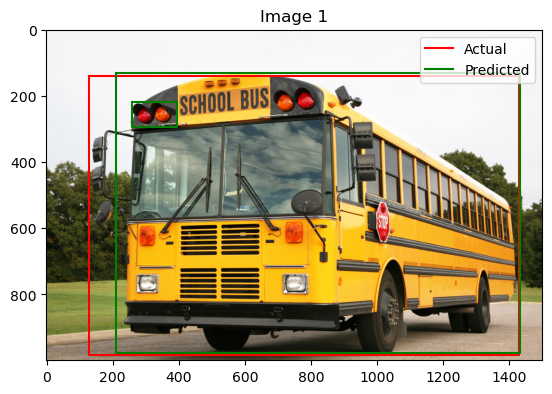

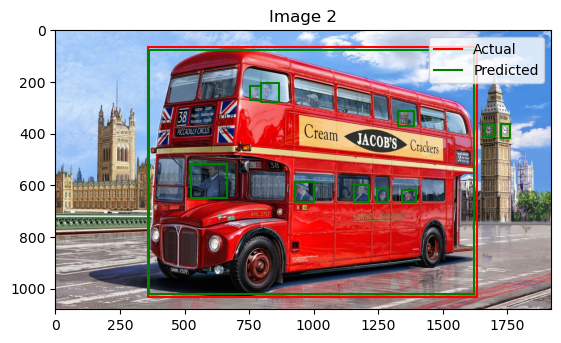

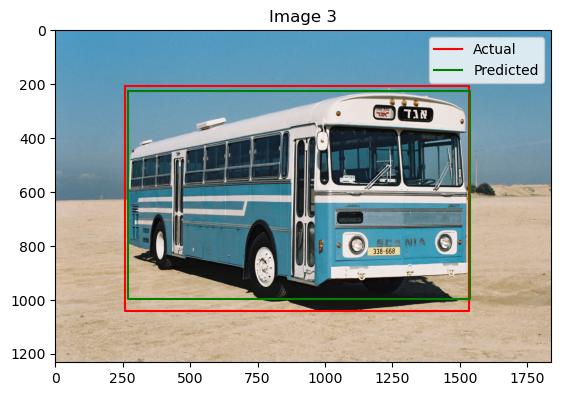

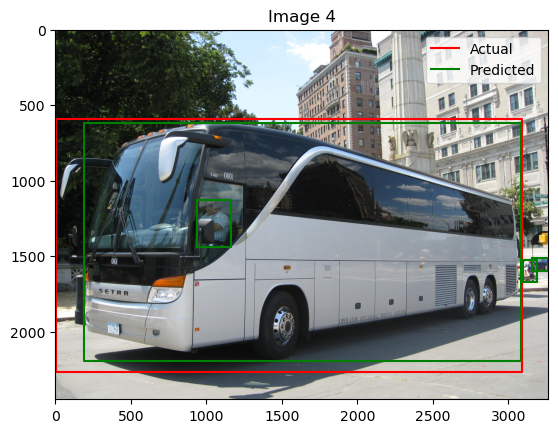

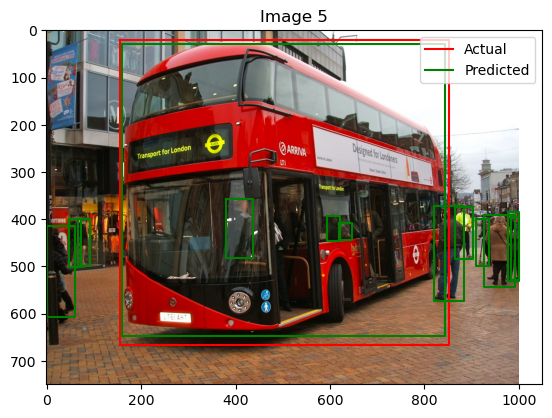

...

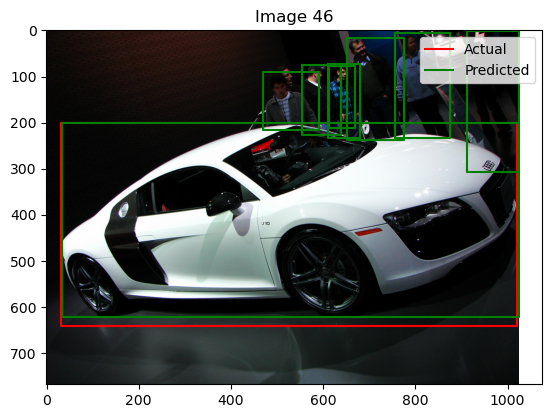

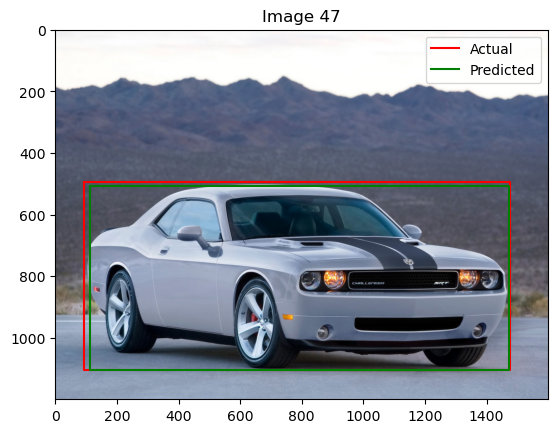

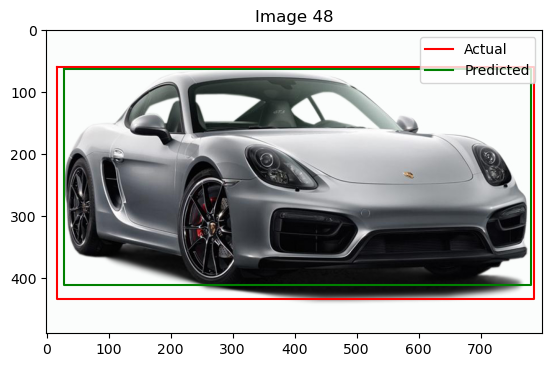

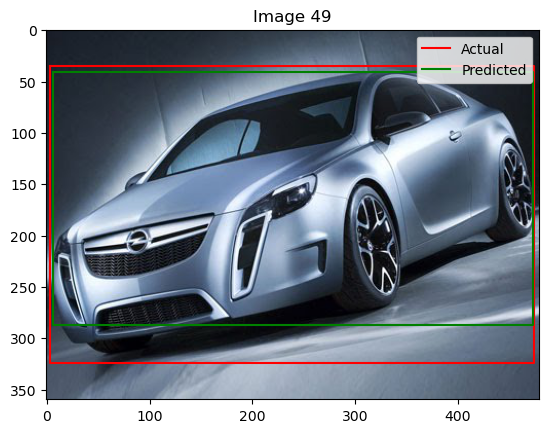

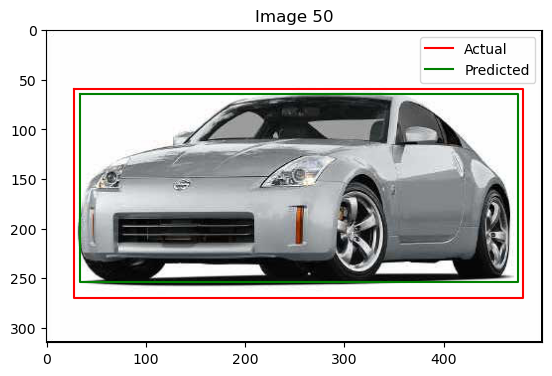

In [11]:
import json
# Compare predicted bounding boxes with actual bounding boxes
# Load the bounding boxes from the labels.csv file
actual_bboxes = labels['region_shape_attributes']

actual_bboxes = [json.loads(bbox.replace('""', '"')) for bbox in actual_bboxes]
# Extract the bounding box coordinates from the labels
actual_bboxes = [[bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']] for bbox in actual_bboxes]

# Loop through each result in results (each result corresponds to one image)
for i, result in enumerate(results):
    # For each image, get the predicted bounding boxes
    predicted_bboxes = result.boxes.xyxy.cpu().numpy()

    # Now 'predicted_bboxes' is a list where each element corresponds to one image's predictions

    # Get the actual bounding boxes for this image
    actual_bbox = actual_bboxes[i]

    # Plot the image
    plt.imshow(imgs[i])

    # Plot the actual bounding box
    plt.plot([actual_bbox[0], actual_bbox[2], actual_bbox[2], actual_bbox[0], actual_bbox[0]],
             [actual_bbox[1], actual_bbox[1], actual_bbox[3], actual_bbox[3], actual_bbox[1]], 'r')

    # Plot the predicted bounding boxes
    for bbox in predicted_bboxes:
        plt.plot([bbox[0], bbox[2], bbox[2], bbox[0], bbox[0]],
                 [bbox[1], bbox[1], bbox[3], bbox[3], bbox[1]], 'g')
        
    plt.legend(['Actual', 'Predicted'], loc='upper right')
    plt.title(f'Image {i + 1}')
    plt.show()
